<a href="https://colab.research.google.com/github/bala-codes/Yolo-v5_Object_Detection_Blood_Cell_Count_and_Detection/blob/master/codes/1.%20Yolo-V5%20BCC%20Training%20%26%20Testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## reference
- https://towardsdatascience.com/yolo-v3-object-detection-53fb7d3bfe6b

## annotation tool
- https://github.com/tzutalin/labelImg
## helmet dataset
- https://www.kaggle.com/abhishek4273/helmet-dataset?
## custom detection(colab)
- https://colab.research.google.com/drive/13iqo2x-x9TbpzbR7-8Fb3Kif1QcZkMs-
## coco dataset
- https://towardsdatascience.com/master-the-coco-dataset-for-semantic-image-segmentation-part-1-of-2-732712631047

In [1]:
# !git clone 'https://github.com/Shenggan/BCCD_Dataset.git'

Cloning into 'BCCD_Dataset'...
remote: Enumerating objects: 800, done.
remote: Total 800 (delta 0), reused 0 (delta 0), pack-reused 800
Receiving objects: 100% (800/800), 7.39 MiB | 36.90 MiB/s, done.
Resolving deltas: 100% (378/378), done.


#**DATA PRE-PROCESSING STARTS**

# Extraction of data labels from .xml file to dataframe

In [1]:
import shutil
import os, sys, random
import xml.etree.ElementTree as ET
from glob import glob
import pandas as pd
from shutil import copyfile
import pandas as pd
from sklearn import preprocessing, model_selection
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import numpy as np
import os

In [2]:
! ls ../

codes  hook_axis  imgs	imgs.zip  total_img.zip


In [3]:
annotations = sorted(glob('../hook_axis/*.xml'))
# annotations

In [4]:
df = []
cnt = 0
for file in annotations:
  prev_filename = file.split('/')[-1].split('.')[0] + '.JPG'
  filename = str(cnt) + '.jpg'
  row = []
  parsedXML = ET.parse(file)
  for node in parsedXML.getroot().iter('object'):
    blood_cells = node.find('name').text
    xmin = int(node.find('bndbox/xmin').text)
    xmax = int(node.find('bndbox/xmax').text)
    ymin = int(node.find('bndbox/ymin').text)
    ymax = int(node.find('bndbox/ymax').text)

    row = [prev_filename, filename, blood_cells, xmin, xmax, ymin, ymax]
    df.append(row)
  cnt += 1

data = pd.DataFrame(df, columns=['prev_filename', 'filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax'])

data[['prev_filename','filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax']].to_csv('./hook_detection.csv', index=False)

# Processing data as per the YOLO_V5 format

**DATAFRAME STRUCTURE**

- filename : contains the name of the image
- cell_type: denotes the type of the cell
- xmin: x-coordinate of the bottom left part of the image
- xmax: x-coordinate of the top right part of the image
- ymin: y-coordinate of the bottom left part of the image
- ymax: y-coordinate of the top right part of the image
- labels : Encoded cell-type **(Yolo - label input-1)**
- width : width of that bbox
- height : height of that bbox
- x_center : bbox center (x-axis)
-	y_center : bbox center (y-axis)
-	x_center_norm	: x_center normalized (0-1) **(Yolo - label input-2)**
-	y_center_norm : y_center normalized (0-1) **(Yolo - label input-3)**
- width_norm : width normalized (0-1) **(Yolo - label input-4)**
-	height_norm : height normalized (0-1) **(Yolo - label input-5)**

In [5]:
from PIL import Image
# img_width = 640
# img_height = 480

def img_width(df):
    im = Image.open('../total_img/'+df.prev_filename)
    return im.size[0]
def img_height(df):
    im = Image.open('../total_img/'+df.prev_filename)
    return im.size[1]
def width(df):
  return int(df.xmax - df.xmin)
def height(df):
  return int(df.ymax - df.ymin)

def x_center(df):
  return int(df.xmin + (df.width/2))
def y_center(df):
  return int(df.ymin + (df.height/2))
# def w_norm(df):
#   return df/img_width
# def h_norm(df):
#   return df/img_height


df = pd.read_csv('./hook_detection.csv')

In [6]:
df.head()

,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax
0,2018_0203_170450_129.JPG,0.jpg,hook,63,128,1,94
1,2018_0203_170505_134.JPG,1.jpg,hook,425,481,50,162
2,2018_0203_170526_141.JPG,2.jpg,hook,455,544,370,480
3,2018_0203_170538_145.JPG,3.jpg,hook,561,618,140,241
4,2018_0203_170541_146.JPG,4.jpg,hook,554,630,153,223


In [ ]:
helmet= pd.read_csv('./helmet_dataset/train_labels.csv')

In [90]:
le = preprocessing.LabelEncoder()
le.fit(df['cell_type'])
print(le.classes_)
labels = le.transform(df['cell_type']) #categorize
df['labels'] = labels

df['img_width'] = df.apply(img_width, axis=1)
df['img_height'] = df.apply(img_height, axis=1)
df.img_width.astype('int')
df.img_height.astype('int')

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

## when size of images are different
df['x_center_norm'] = df[['x_center','img_width']].apply(lambda x: x[0]/x[1], axis=1) #/img_width
df['width_norm'] = df[['width','img_width']].apply(lambda x: x[0]/x[1], axis=1)

df['y_center_norm'] = df[['y_center','img_width']].apply(lambda x: x[0]/x[1], axis=1)
df['height_norm'] = df[['height','img_width']].apply(lambda x: x[0]/x[1], axis=1)

# def w_norm(df):
#   return df/img_width
# def h_norm(df):
#   return df/img_height

# df['x_center_norm'] = df['x_center'].apply(w_norm) #/img_width
# df['width_norm'] = df['width'].apply(w_norm)

# df['y_center_norm'] = df['y_center'].apply(h_norm)
# df['height_norm'] = df['height'].apply(h_norm)

df.head(30)

['hook']


,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax,labels,img_width,img_height,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,2018_0203_170450_129.JPG,0.jpg,hook,63,128,1,94,0,640,480,65,93,95,47,0.148438,0.101562,0.073438,0.145313
1,2018_0203_170505_134.JPG,1.jpg,hook,425,481,50,162,0,640,480,56,112,453,106,0.707812,0.087500,0.165625,0.175000
2,2018_0203_170526_141.JPG,2.jpg,hook,455,544,370,480,0,640,480,89,110,499,425,0.779687,0.139063,0.664062,0.171875
3,2018_0203_170538_145.JPG,3.jpg,hook,561,618,140,241,0,640,480,57,101,589,190,0.920312,0.089063,0.296875,0.157812
4,2018_0203_170541_146.JPG,4.jpg,hook,554,630,153,223,0,640,480,76,70,592,188,0.925000,0.118750,0.293750,0.109375
5,2018_0203_170544_147.JPG,5.jpg,hook,565,640,146,224,0,640,480,75,78,602,185,0.940625,0.117188,0.289062,0.121875
6,2018_0203_171516_035.JPG,6.jpg,hook,1120,1420,1536,2084,0,4032,3024,300,548,1270,1810,0.314980,0.074405,0.448909,0.135913
7,2018_0203_171516_035.JPG,6.jpg,hook,2332,2644,1596,2224,0,4032,3024,312,628,2488,1910,0.617063,0.077381,0.473710,0.155754
8,2018_0203_171519_036.JPG,7.jpg,hook,1320,1572,1560,2144,0,4032,3024,252,584,1446,1852,0.358631,0.062500,0.459325,0.144841
9,2018_0203_171522_037.JPG,8.jpg,hook,1392,1592,1560,2216,0,4032,3024,200,656,1492,1888,0.370040,0.049603,0.468254,0.162698


2018_0203_171516_035.jpg 	6.jpg 	

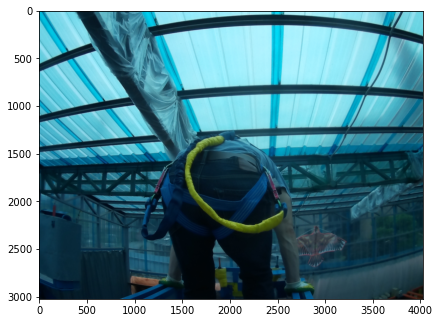

In [56]:
#@title SAMPLE PLOT - shape (480, 640, 3)
fig = plt.figure()
import cv2
#add axes to the image
ax = fig.add_axes([0,0,1,1])

# read and plot the image
image = plt.imread('../total_img/2018_0203_171516_035.JPG')
plt.imshow(image)

In [91]:
for _,row in df[df.filename == "6.jpg"].iterrows():
#     print(_)
    print(row)

prev_filename    2018_0203_171516_035.JPG
filename                            6.jpg
cell_type                            hook
xmin                                 1120
xmax                                 1420
ymin                                 1536
ymax                                 2084
labels                                  0
img_width                            4032
img_height                           3024
width                                 300
height                                548
x_center                             1270
y_center                             1810
x_center_norm                     0.31498
width_norm                      0.0744048
y_center_norm                    0.448909
height_norm                      0.135913
Name: 6, dtype: object
prev_filename    2018_0203_171516_035.JPG
filename                            6.jpg
cell_type                            hook
xmin                                 2332
xmax                                 2644
ymin       

In [92]:
# iterating over the image for different objects
for _,row in df[df.filename == "6.jpg"].iterrows():
    xmin = row.xmin
    xmax = row.xmax
    ymin = row.ymin
    ymax = row.ymax
    
    width = xmax - xmin
    height = ymax - ymin
    
    if row.cell_type == 'hook':
        edgecolor = 'r'
        ax.annotate('hook', xy=(xmax-40,ymin+20))
#     # assign different color to different classes of objects
#     if row.cell_type == 'RBC':
#         edgecolor = 'r'
#         ax.annotate('RBC', xy=(xmax-40,ymin+20))
#     elif row.cell_type == 'WBC':
#         edgecolor = 'b'
#         ax.annotate('WBC', xy=(xmax-40,ymin+20))
#     elif row.cell_type == 'Platelets':
#         edgecolor = 'g'
#         ax.annotate('Platelets', xy=(xmax-40,ymin+20))
        
    # add bounding boxes to the image
    rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none')
    
    ax.add_patch(rect)

# Splitting into training and validation datasets

In [93]:
df_train, df_valid = model_selection.train_test_split(df, test_size=0.1, random_state=13, shuffle=True)
print(df_train.shape, df_valid.shape)

(279, 18) (32, 18)


In [94]:
! ls ../

BCCD_Dataset	   hook_axis	  Inference_files  total_img_list.csv
codes		   hook_axis.zip  LICENSE	   yolov5-master
data-preprocecced  imgs		  README.md	   yolov5-master.zip
data-preprocessed  inference	  total_img


In [95]:
os.mkdir('../data-preprocecced')
os.mkdir('../data-preprocecced/bcc/')
os.mkdir('../data-preprocecced/bcc/images/')
os.mkdir('../data-preprocecced/bcc/images/train/')
os.mkdir('../data-preprocecced/bcc/images/valid/')

os.mkdir('../data-preprocecced/bcc/labels/')
os.mkdir('../data-preprocecced/bcc/labels/train/')
os.mkdir('../data-preprocecced/bcc/labels/valid/')

FileExistsError: [Errno 17] File exists: '../data-preprocecced'

# Data segregation and moving to it's corresponding folders
- BCC
  - Images
    - Train (364 images [.jpg files])
    - Valid (270 images [.jpg files])
  - Labels
    - Train (364 labels [.txt files])
    - Valid (270 labels [.txt files])


**STRUCTURE OF .txt FILE**

- One row per object
- Each row is class x_center y_center width height format.
- Box coordinates must be in normalized xywh format (from 0 - 1). If your boxes  are in pixels, divide x_center and width by image width, and y_center and height by image height.
- Class numbers are zero-indexed (start from 0).


<img src="https://github.com/bala-codes/Yolo-v5_Object_Detection_Blood_Cell_Count_and_Detection/blob/master/imgs/label_txt.PNG?raw=true" width="50%">


In [108]:
def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.filename:  
    filenames.append(filename)
  filenames = set(filenames)
  
  for filename in filenames:
    yolo_list = []

    for _,row in df[df.filename == filename].iterrows():
      yolo_list.append([row.labels, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
#     print("yolo_list[:3]:",yolo_list[:3])
    txt_filename = os.path.join(train_label_path,str(row.prev_filename.split('.')[0])+".txt")
#     print(txt_filename)
    # Save the .img & .txt files to the corresponding train and validation folders
    np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    shutil.copyfile(os.path.join(img_path,row.prev_filename), os.path.join(train_img_path,row.prev_filename))

In [106]:
! ls ../

BCCD_Dataset	   hook_axis	  Inference_files  total_img_list.csv
codes		   hook_axis.zip  LICENSE	   yolov5-master
data-preprocecced  imgs		  README.md	   yolov5-master.zip
data-preprocessed  inference	  total_img


In [109]:
%%time
# src_img_path = "../BCCD_Dataset/BCCD/JPEGImages/"
# src_label_path = "../BCCD_Dataset/BCCD/Annotations/"
src_img_path = "../total_img/"
src_label_path = "../hook_axis/"

# train_img_path = "../images/train"
# train_label_path = "../data-preprocecced/bcc/labels/train"
train_img_path = "../imgs/images/train"
train_label_path = "../imgs/labels/train"

valid_img_path = "../imgs/images/valid"
valid_label_path = "../imgs/labels/valid"

segregate_data(df_train, src_img_path, src_label_path, train_img_path, train_label_path)
segregate_data(df_valid, src_img_path, src_label_path, valid_img_path, valid_label_path)

CPU times: user 195 ms, sys: 158 ms, total: 353 ms
Wall time: 679 ms


In [110]:
try:
  shutil.rmtree('../imgs/images/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../imgs/images/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../imgs/labels/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('../imgs/labels/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

print("No. of Training images", len(os.listdir('../imgs/images/train')))
print("No. of Training labels", len(os.listdir('../imgs/labels/train')))

print("No. of valid images", len(os.listdir('../imgs/images/valid')))
print("No. of valid labels", len(os.listdir('../imgs/labels/valid')))

No. of Training images 235
No. of Training labels 235
No. of valid images 32
No. of valid labels 32


# **END OF DATA PRE-PROCESSING**

#**YOLO V5 STARTS**

In [45]:
# !cp -r '/content/bcc' '/content/drive/My Drive/Machine Learning Projects/YOLO/'

# Cloning from the yolo v5 repo.
More can be found at here : [yolo](https://github.com/ultralytics/yolov5)

In [46]:
# !git clone  'https://github.com/ultralytics/yolov5.git'
## I downloaded as a zip file

In [12]:
!pip install -qr '/content/yolov5/requirements.txt'  # install dependencies

     |████████████████████████████████| 276kB 5.5MB/s 


# WE SHOULD CREATE A .yaml FILE AND THEN PLACE IT INSIDE THE yolov5 FOLDER

#**Contents of YAML file**

train: /content/bcc/images/train                    
val: /content/bcc/images/valid

nc: 3

names: ['Platelets', 'RBC', 'WBC']


<img src="https://github.com/bala-codes/Yolo-v5_Object_Detection_Blood_Cell_Count_and_Detection/blob/master/imgs/bcc_yaml.PNG?raw=true" width="50%">



In [33]:
shutil.copyfile('./bcc.yaml', '../yolov5/bcc.yaml')

'../yolov5/bcc.yaml'

#**Also edit the number of classes (nc) in the ./models/*.yaml file**

Choose the yolo model of your choice, here I chose yolov5s.yaml (yolo - small)


<img src="https://cdn-images-1.medium.com/max/600/1*hCE5VwKkqHlZW466umYTTA.png">

# Training command

**Training Parameters**

!python 
- <'location of train.py file'> 
- --img <'width of image'>
- --batch <'batch size'>
- --epochs <'no of epochs'>
- --data <'location of the .yaml file'>
- --cfg <'Which yolo configuration you want'>(yolov5s/yolov5m/yolov5l/yolov5x).yaml | (small, medium, large, xlarge)
- --name <'Name of the best model after training'>

**METRICS FROM TRAINING PROCESS**

**No.of classes, No.of images, No.of targets, Precision (P), Recall (R), mean Average Precision (map)**
- Class | Images | Targets | P | R | mAP@.5 | mAP@.5:.95: |
- all   | 270    |     489 |    0.0899 |       0.827 |      0.0879 |      0.0551

In [111]:
%%time

!python train.py --img 235 --batch 8 --epochs 100 --data hook.yaml --cfg models/yolov5s.yaml --name HOOK

Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)

Namespace(adam=False, batch_size=8, bucket='', cache_images=False, cfg='models/yolov5s.yaml', data='hook.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='data/hyp.finetune.yaml', img_size=[235, 235], local_rank=-1, logdir='runs/', multi_scale=False, name='HOOK', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=8, weights='yolov5s.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'momentum': 0.94, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.4, 'cls_pw': 1.0, 'obj': 0.5, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 1.0, 'translate': 0.1, 'scale': 0.6, 'shear': 1.0, 'perspective': 0.0, 'flipud': 0.01, 'fliplr': 0.5, 'mixup': 0.2}
Overriding model

     10/99    0.466G   0.09421   0.03402         0    0.1282         7       256
               Class      Images     Targets           P           R      mAP@.5
                 all          32          32           0           0      0.0252     0.00662

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     11/99    0.466G   0.09961   0.03402         0    0.1336         8       256
               Class      Images     Targets           P           R      mAP@.5
                 all          32          32       0.361       0.142      0.0842      0.0153

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     12/99    0.466G    0.0875   0.02993         0    0.1174         9       256
               Class      Images     Targets           P           R      mAP@.5
                 all          32          32       0.277       0.156        0.12       0.025

     Epoch   gpu_mem      GIoU       obj       cls     total   targets


     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     59/99    0.466G   0.05581    0.0275         0    0.0833         6       256
               Class      Images     Targets           P           R      mAP@.5
                 all          32          32       0.274       0.719       0.488       0.114

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     60/99    0.466G   0.05417   0.02871         0   0.08288        10       256
               Class      Images     Targets           P           R      mAP@.5
                 all          32          32       0.264       0.656       0.404        0.11

     Epoch   gpu_mem      GIoU       obj       cls     total   targets  img_size
     61/99    0.466G   0.05577   0.02767         0   0.08344         6       256
               Class      Images     Targets           P           R      mAP@.5
                 all          32          32       0.264       0.656       0.414  

In [112]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 22131), started 1:31:18 ago. (Use '!kill 22131' to kill it.)


ddd#**INFERENCE**

In [ ]:
#Optimizer stripped from runs/exp2_BCCM/weights/last_BCCM.pt, 14.8MB
#Optimizer stripped from runs/exp2_BCCM/weights/best_BCCM.pt, 14.8MB

# BATCH PREDICTION
- Results saved to inference/output


**Inference Parameters**

!python 
- <'location of detect.py file'> 
- --source <'location of image/ folder to predict'>
- --weight <'location of the saved best weights'>
- --output <'location of output files after prediction'>

In [114]:
!python detect.py --source ../imgs/images/valid/ --weights './runs/exp4_HOOK/weights/best_HOOK.pt' --output 'inference/output'

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='../imgs/images/valid/', update=False, view_img=False, weights=['./runs/exp4_HOOK/weights/best_HOOK.pt'])
Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)

Fusing layers... 
Model Summary: 140 layers, 7.24652e+06 parameters, 6.61683e+06 gradients
image 1/32 /home/dayoung/dev/Yolo_Object_Detection/imgs/images/valid/2018_0203_171530_040.JPG: 512x640 1 hooks, Done. (0.009s)
image 2/32 /home/dayoung/dev/Yolo_Object_Detection/imgs/images/valid/2018_0203_171534_041.JPG: 512x640 1 hooks, Done. (0.008s)
image 3/32 /home/dayoung/dev/Yolo_Object_Detection/imgs/images/valid/2018_0203_171649_066.JPG: 512x640 1 hooks, Done. (0.008s)
image 4/32 /home/dayoung/dev/Yolo_Object_Detection/imgs/images/valid/2018_0203_171713_074.JPG: 512x640 2 hooks, Done. (0.008s)
image 5/32 /home/dayoung/dev/Yolo_Object_D

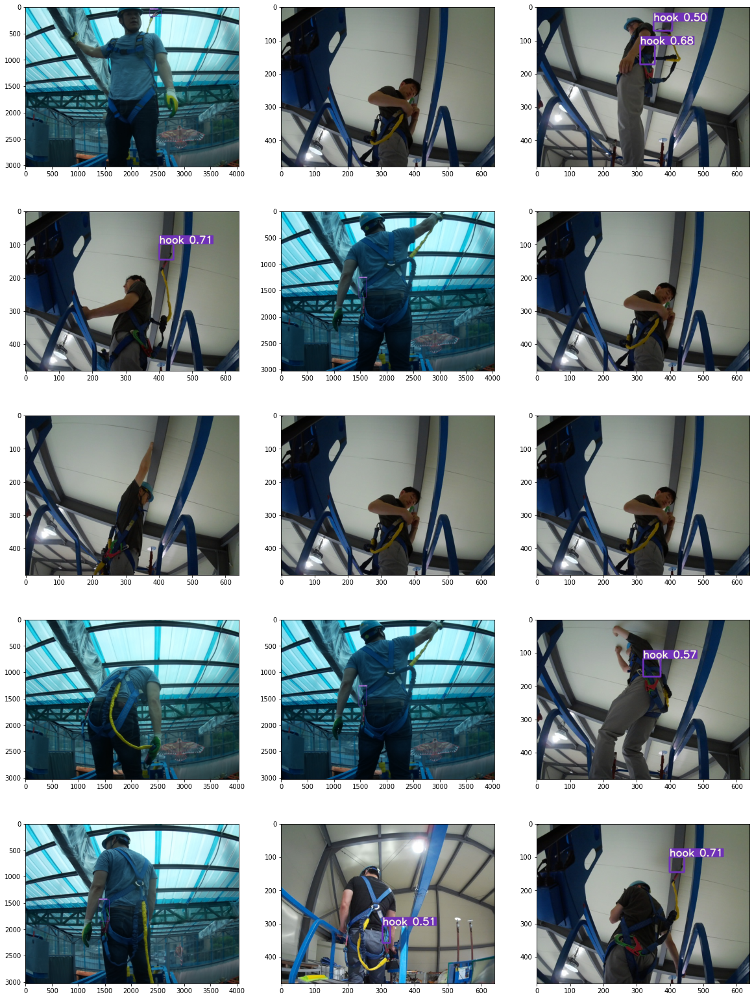

In [116]:
disp_images = glob('inference/output/*')
fig=plt.figure(figsize=(20, 28))
columns = 3
rows = 5
for i in range(1, columns*rows +1):
    img = np.random.choice(disp_images)
    img = plt.imread(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

# SINGLE IMAGE PREDICTIONS


In [117]:
! ls ../imgs/images/valid

2018_0203_171530_040.JPG  2018_0211_172506_442.JPG  2020_0813_110534_368.JPG
2018_0203_171534_041.JPG  2018_0211_180846_104.JPG  2020_0813_110811_420.JPG
2018_0203_171649_066.JPG  2018_0211_180937_121.JPG  2020_0813_113559_912.JPG
2018_0203_171713_074.JPG  2018_0211_181204_170.JPG  2020_0813_114030_1002.JPG
2018_0203_171725_078.JPG  2018_0211_181219_175.JPG  2020_0813_114125_1020.JPG
2018_0203_171828_099.JPG  2018_0211_181246_184.JPG  2020_0813_114337_1064.JPG
2018_0203_171846_105.JPG  2020_0805_104653_079.JPG  2020_0813_114444_1086.JPG
2018_0211_171122_185.JPG  2020_0805_110118_284.JPG  2020_0813_115129_1172.JPG
2018_0211_171618_266.JPG  2020_0813_105132_130.JPG  2020_0813_115205_1184.JPG
2018_0211_171651_277.JPG  2020_0813_105932_248.JPG  2020_0813_115220_1189.JPG
2018_0211_172400_420.JPG  2020_0813_110331_327.JPG


In [118]:
output = !python detect.py --source ../imgs/images/valid/2018_0211_180937_121.JPG \
--weights './runs/exp4_HOOK/weights/best_HOOK.pt' --output 'inference/single_output'
print(output)

["Using CUDA device0 _CudaDeviceProperties(name='GeForce RTX 2060', total_memory=5931MB)", '', 'Model Summary: 140 layers, 7.24652e+06 parameters, 6.61683e+06 gradients', "Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/single_output', save_txt=False, source='../imgs/images/valid/2018_0211_180937_121.JPG', update=False, view_img=False, weights=['./runs/exp4_HOOK/weights/best_HOOK.pt'])", 'Fusing layers... ', 'image 1/1 /home/dayoung/dev/Yolo_Object_Detection/imgs/images/valid/2018_0211_180937_121.JPG: 512x640 Done. (0.008s)', 'Results saved to inference/single_output', 'Done. (0.025s)']


['inference/single_output/2018_0211_180937_121.JPG']


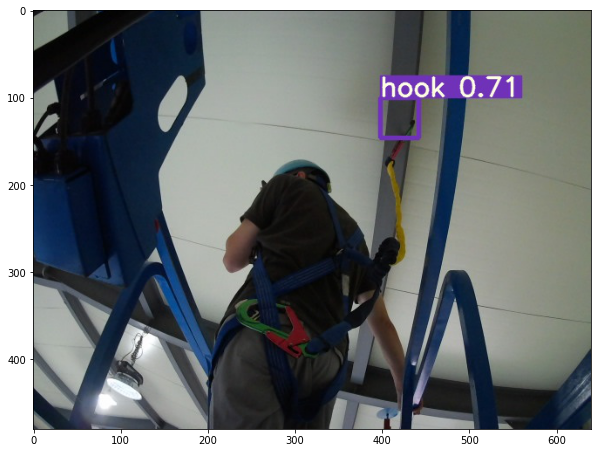

In [119]:
disp_images = glob('inference/single_output/*')
print(disp_images)
fig=plt.figure(figsize=(10, 18))
plt.imread(disp_images[0])
plt.imshow(img)

# You need these files, if you wish to move the model to production

## Files

In [27]:
shutil.copyfile('/content/yolov5/detect.py', '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/detect.py')
shutil.copyfile('/content/yolov5/requirements.txt', '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/requirements.txt')
shutil.copyfile('/content/runs/exp2_BCCM/weights/best_BCCM.pt', '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/best_BCCM.pt')



## Folder

In [ ]:
!cp -r '/content/yolov5/models' '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/'
!cp -r '/content/yolov5/utils' '/content/drive/My Drive/Machine Learning Projects/YOLO/SOURCE/'
